<h1>Monitoramento Inteligente da Operação de Dressagem de Rebolos
Convencionais: Uma Nova Metodologia Baseada em Dados de Emissão Acústica,
Análise Tempo-frequência e Redes Neurais Convolucionais
</h1>

Ronald J. Contijo*, Wenderson N. Lopes*, Renan O. A. Takeuchi*,
João Paulo L. S. de Almeida*, Paulo R. Aguiar**

* Instituto Federal do Paraná (IFPR), campus Jacarezinho, Avenida Dr. Tito, 801, Jardim Panorama, Jacarezinho, PR, CEP: 86400-000, Brazil (e-mail: wenderson.lopes@ifpr.edu.br).

** Department of Electrical Engineering, UNESP, Av. Eng. Luiz E. C. Coube, 14-01, CEP: 17033-360, Bauru, SP, Brazil (e-
mail: paulo.aguiar@unesp.br).

🙂

Caso deseje as imagens do treinamento por favor envie um e-mail para: ronaldcontijofuncionagmail.com

#Importação das bibliotecas

In [ ]:
#Biblioteca para computação científica e trabalho com números
import numpy as np

#Plotagem de gráficos
import matplotlib.pyplot as plt
import matplotlib.patches as patches

#Python Image Library - Operações com imagens
from PIL import Image

#Operation System - Operações de sistema operacional
import os

#Trabalho com caminhos de diretórios do sistema
import pathlib

#Rede Neural
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

#Módulo para salvar em CSV para fazer gráficos no Excel
from tensorflow.keras.callbacks import CSVLogger


#Instalação de algumas bibliotecas
rarfile - Trabalho com arquivos .rar

In [ ]:
!pip install rarfile

mplcyberpunk - estilo para os gráficos

In [ ]:
!pip install mplcyberpunk

#Extrair os arquivos compactados

Modifique o caminho para o diretório onde estão os conjuntos de dados

In [ ]:
import os
from rarfile import RarFile
import mplcyberpunk

arquivos = ["VERIFICACAO.rar","UNDRESSED.rar","DRESSED.rar"]
nomesPastas = ["verificacao","./train/UNDRESSED","./train/DRESSED"]
for i in range(0,len(arquivos)):
  if not os.path.exists(arquivos[i]):
      print("O arquivo RAR não está presente!!!!!!")
      print("Ou talvez não esteja no diretório correto!!!!!!")
  else:
      os.makedirs(nomesPastas[i], exist_ok=True)

      arquivo_rar = arquivos[i]
      pasta_destino = nomesPastas[i]

      with RarFile(arquivo_rar, 'r') as rf:
        try:
          rf.extractall(path=pasta_destino)
        except:
          pass

      print("Descompactação concluída. Os arquivos foram extraídos para a pasta "+nomesPastas[i])


Descompactação concluída. Os arquivos foram extraídos para a pasta verificacao
Descompactação concluída. Os arquivos foram extraídos para a pasta ./train/UNDRESSED
Descompactação concluída. Os arquivos foram extraídos para a pasta ./train/DRESSED


Diretórios das classes de treinamento

volta um diretório

In [ ]:
ls

DRESSED/     sample_data/  UNDRESSED/     verificacao/
DRESSED.rar  train/        UNDRESSED.rar  VERIFICACAO.rar


In [ ]:

#Diretório contendo as Undressed
train_undressed_dir = os.path.join('./train/UNDRESSED/UNDRESSED')

#Diretório contendo as Dressed
train_dressed_dir = os.path.join('./train/DRESSED/DRESSED')

In [ ]:
print("=====================================")
train_undressed_names = os.listdir(train_undressed_dir)
#print(train_undressed_names[:10])
print(f"Existem {len(train_undressed_names)} imagens undressed")
print("=====================================")

train_dressed_names = os.listdir(train_dressed_dir)
#print(train_dressed_names[:10])
print(f"Existem {len(train_dressed_names)} imagens dressed")

Existem 79 imagens undressed
Existem 279 imagens dressed


#Modelo

In [ ]:

# Caminho do diretorio de imagens
local_images_dir = "./train"


data_dir = pathlib.Path(local_images_dir)

#contar quantas imagens tem
image_count = len(list(data_dir.glob('*/*.jpg')))

#dividir as imagens em 16 pacotinhos
batch_size = 16

#tamanho de redimensionamento das imagens
img_height = 180
img_width = 180

#definição do dataset de treinamento
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,# caminho da pasta
  validation_split=0.2,# 80% para treinamento e 20% para validação
  subset="training",#nome do conjunto de dados
  seed=123,#seed para replicabilidade
  image_size=(img_height, img_width),
  batch_size=batch_size)

#definição do dataset de validação
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_ds.class_names
print(f"As classes são {class_names}")

Found 358 files belonging to 2 classes.
Using 287 files for training.
Found 358 files belonging to 2 classes.
Using 71 files for validation.
As classes são ['DRESSED', 'UNDRESSED']


In [ ]:

AUTOTUNE = tf.data.AUTOTUNE#otimização automática tensorflow

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)#embaralha as imagens de entrada
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)


normalization_layer = layers.Rescaling(1./255)#normalizar as imagens,
#elas estão em RGB que vai de 0 a 255, depois da normalização eles vão de a até 1

normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]

num_classes = len(class_names)

print(f"O número de classes é {num_classes}")

O número de classes é 2


In [ ]:


#foram feitos experimentos com aumentação, não foi interessante para a aplicação da pesquisa
data_augmentation = keras.Sequential(#Definição da camada inicial
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
  ]
)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),#normalização


  layers.Conv2D(16, 3, padding='same', activation='relu'),#camada de convolução com função de ativação
  #relu (rectified linear unit)
  layers.MaxPooling2D(),#camada de pooling2d

  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),

  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),

  layers.MaxPooling2D(),

  layers.Flatten(),


  layers.Dense(64, activation='relu'),


  #layers.Dense(1, name="outputs")
  layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 90, 90, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                 

In [ ]:
epochs = 50

csv_logger = CSVLogger('TREINAMENTO.csv')#nome do csv

#treinamento
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[csv_logger]
)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5818: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


18/18 [==============================] - 14s 672ms/step - loss: 0.5232 - accuracy: 0.7875 - val_loss: 0.3692 - val_accuracy: 0.8592
Epoch 2/50
18/18 [==============================] - 9s 527ms/step - loss: 0.3840 - accuracy: 0.8537 - val_loss: 0.3538 - val_accuracy: 0.8451
Epoch 3/50
18/18 [==============================] - 8s 424ms/step - loss: 0.3216 - accuracy: 0.8746 - val_loss: 0.2217 - val_accuracy: 0.9296
Epoch 4/50
18/18 [==============================] - 9s 508ms/step - loss: 0.3373 - accuracy: 0.8746 - val_loss: 0.2446 - val_accuracy: 0.9014
Epoch 5/50
18/18 [==============================] - 9s 489ms/step - loss: 0.3006 - accuracy: 0.8850 - val_loss: 0.2111 - val_accuracy: 0.9296
Epoch 6/50
18/18 [==============================] - 7s 399ms/step - loss: 0.2557 - accuracy: 0.8955 - val_loss: 0.2004 - val_accuracy: 0.9437
Epoch 7/50
18/18 [==============================] - 9s 484ms/step - loss: 0.2286 - accuracy: 0.9233 - val_loss: 0.1359 - val_accuracy: 0.9437
Epoch 8/50
18/18

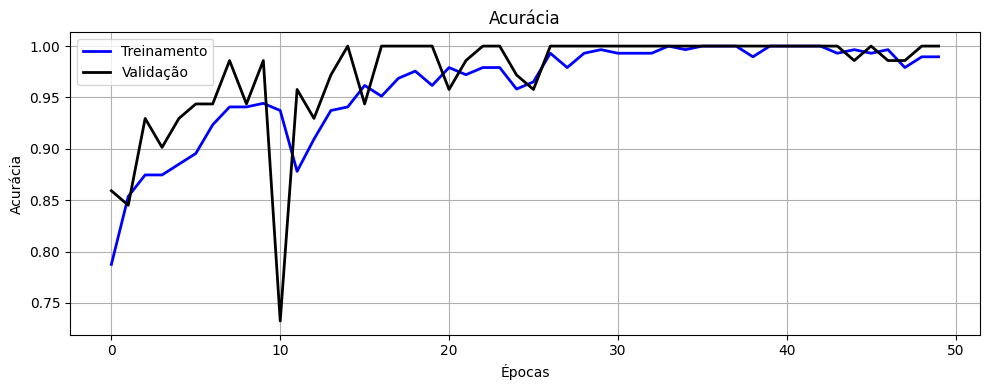

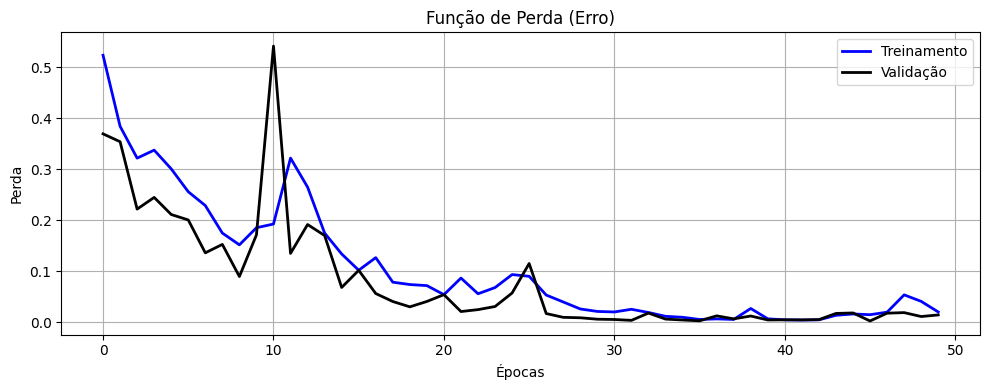

In [ ]:
# Plotando gráficos do sistema
import matplotlib.pyplot as plt
import mplcyberpunk

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epocas = range(len(acc))

plt.figure(figsize=(10, 4))
plt.plot(epocas, acc, label='Treinamento', linewidth=2, color='blue')
plt.plot(epocas, val_acc, label='Validação', linewidth=2, color='purple')
plt.title('Acurácia')
plt.xlabel('Épocas')
plt.ylabel('Acurácia')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(epocas, loss, label='Treinamento', linewidth=2, color='blue')
plt.plot(epocas, val_loss, label='Validação', linewidth=2, color='purple')
plt.title('Função de Perda (Erro)')
plt.xlabel('Épocas')
plt.ylabel('Perda')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#Etapa de teste de imagens


In [ ]:
#vlistas para salvar num csv
nomes_csv = []
labelVerdadeiro=[]
labelPredito=[]
acuraciaPercentagem=[]
resultadoFuncaoAtivacao=[]
numero=[]
acertou = []

contador = 1
#Diretório onde as imagens Undressed para testes estão localizadas
diretorio_imagens = "./verificacao/VALIDAÇÃO v03/Undressed/"

#Listar todos os arquivos no diretório
arquivos = os.listdir(diretorio_imagens)

print(f"O número de arquivos da classe {len(arquivos)}")

for arquivo in arquivos:
    #caminho da imagem
    sunflower_url = os.path.join(diretorio_imagens, arquivo)
    print(sunflower_url)
    if arquivo.endswith(".png"):
        #carrega a imagem
        img = tf.keras.utils.load_img(
            sunflower_url, target_size=(img_height, img_width)
        )
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0)

        x=img_array
        x /= 255
        x=np.expand_dims(x, axis=0)

        classes = model.predict(img_array)

        print(classes[0])#previsão da rede

        classe=""
        percent=0
        if classes[0]>0.5:
          classe = "Undressed"
          percent = np.round(classes[0], 6)*100
        else:
          classe = "Dressed"
          percent = (1-np.round(classes[0], 6))*100

        if(classe=="Undressed"):
          acertou.append(1)
        else:
          acertou.append(0)
        contador+=1
        numero.append(contador)
        nomes_csv.append(arquivo)
        labelVerdadeiro.append("Undressed")
        labelPredito.append(classe)
        acuraciaPercentagem.append(percent)
        resultadoFuncaoAtivacao.append(np.round(classes[0], 3))
        # Texto para o título da imagem
        title_text = f"A imagem a seguir pertence a classe {classe} com {percent} percento de confiança."

        # Exibir a imagem com o título usando matplotlib
        plt.figure()
        plt.imshow(img_array[0]/255.0)  # Normalizar os valores de pixel para o intervalo [0, 1]
        plt.title(title_text)
        plt.axis('off')
        plt.show()

FileNotFoundError: [Errno 2] No such file or directory: './verificacao/VALIDAÇÃO v03/Undressed/'

O número de arquivos da classe 72
./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_13.png
1/1 [==============================] - 0s 42ms/step
[0.00163296]


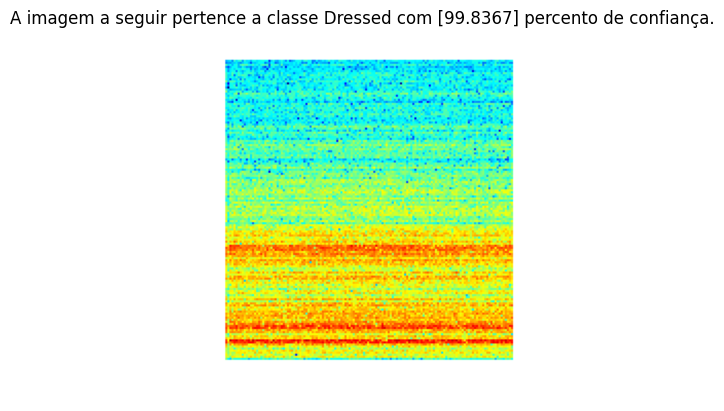

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_17.png
1/1 [==============================] - 0s 46ms/step
[1.0536272e-05]


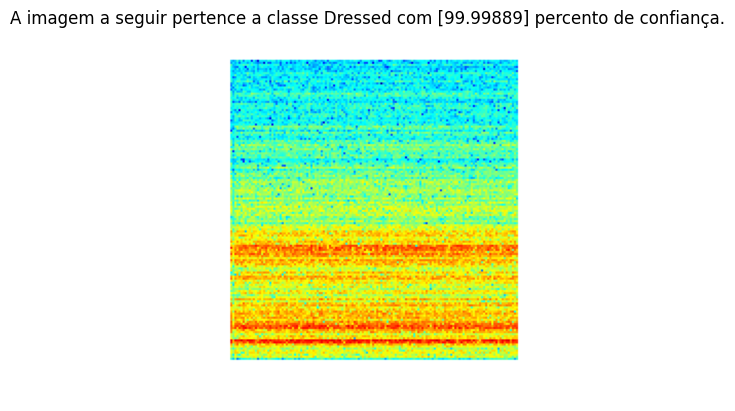

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_14.png
1/1 [==============================] - 0s 48ms/step
[0.00087401]


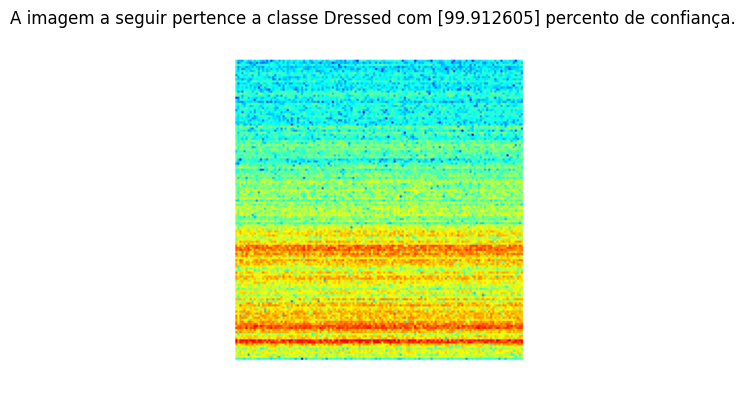

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_15.png
1/1 [==============================] - 0s 45ms/step
[3.7196212e-05]


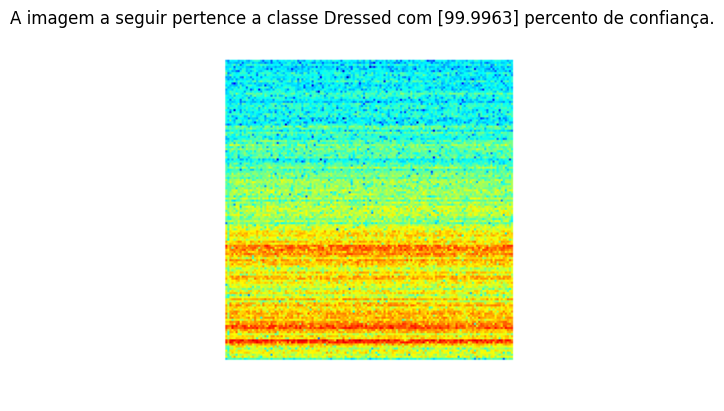

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_16.png
1/1 [==============================] - 0s 29ms/step
[2.9560842e-05]


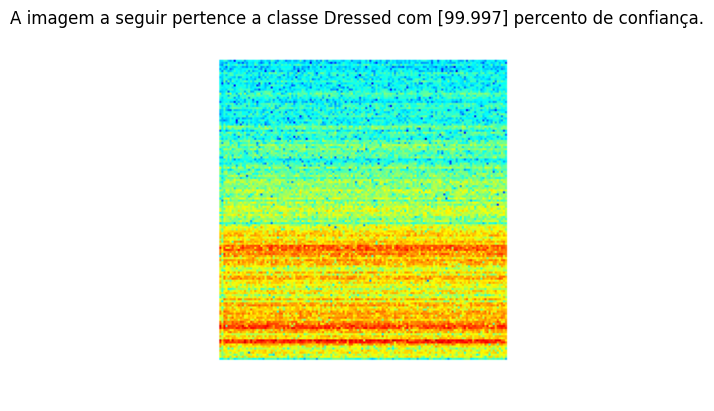

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_20.png
1/1 [==============================] - 0s 28ms/step
[8.308802e-06]


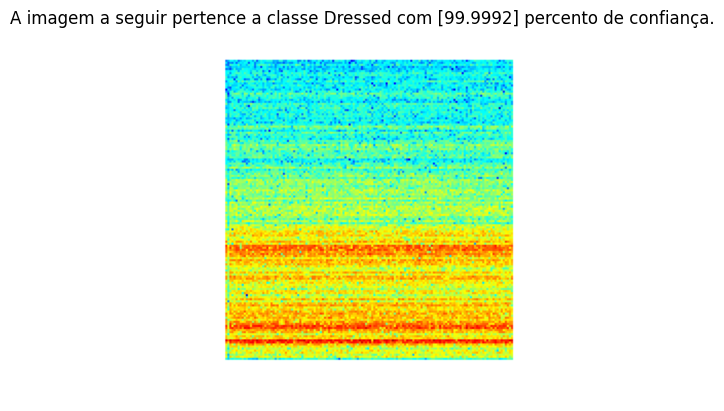

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_21.png
1/1 [==============================] - 0s 29ms/step
[2.9537114e-05]


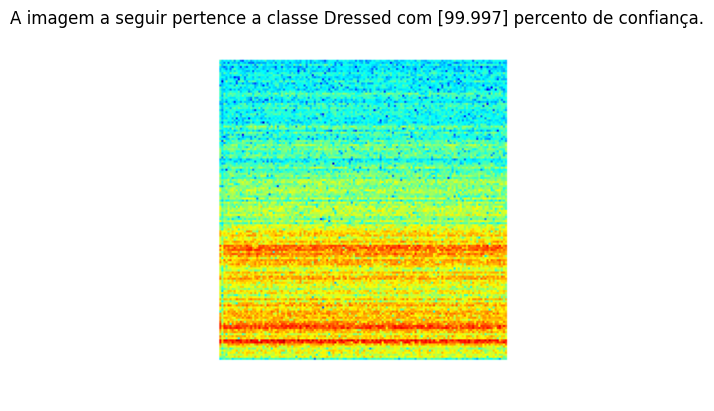

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_22.png
1/1 [==============================] - 0s 30ms/step
[2.1664524e-05]


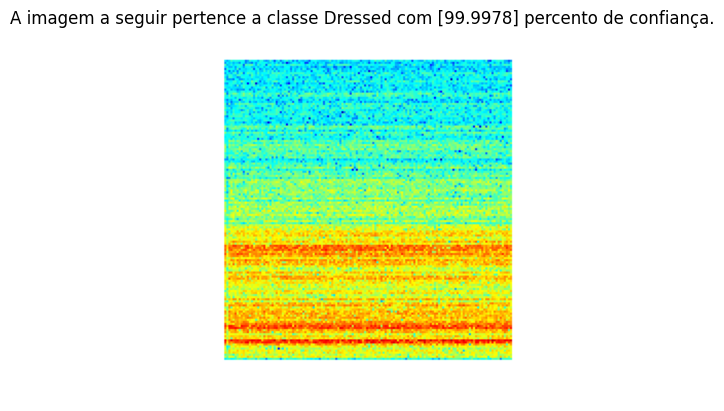

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_23.png
1/1 [==============================] - 0s 28ms/step
[8.6221626e-05]


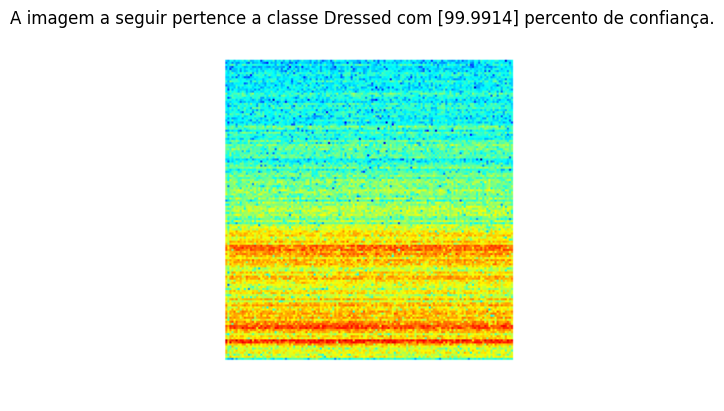

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_19.png
1/1 [==============================] - 0s 29ms/step
[5.9684444e-05]


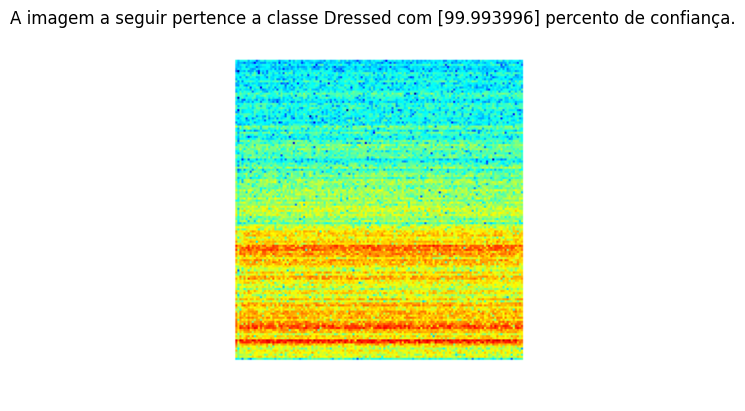

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_24.png
1/1 [==============================] - 0s 28ms/step
[2.4216874e-06]


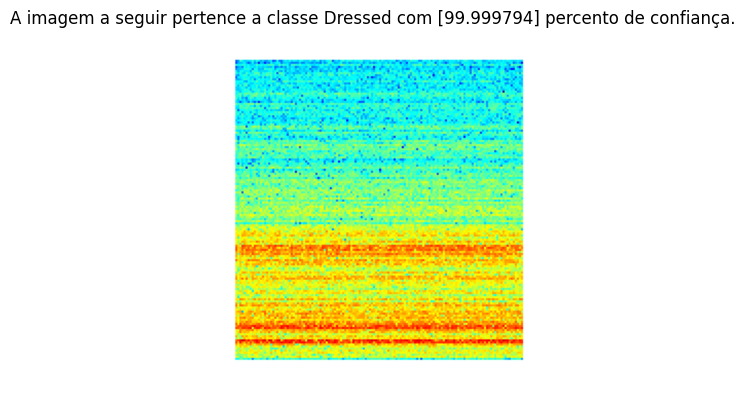

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_18.png
1/1 [==============================] - 0s 28ms/step
[4.055426e-05]


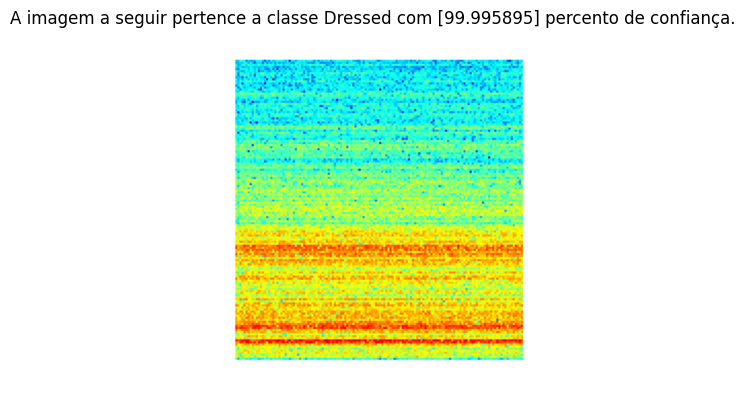

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_27.png
1/1 [==============================] - 0s 29ms/step
[0.00095739]


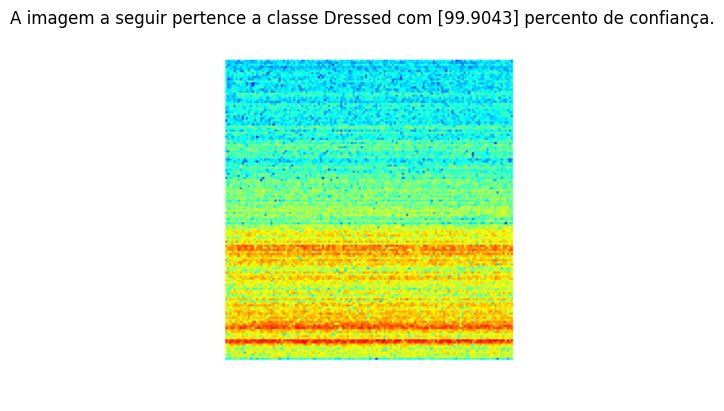

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_25.png
1/1 [==============================] - 0s 27ms/step
[3.7598962e-05]


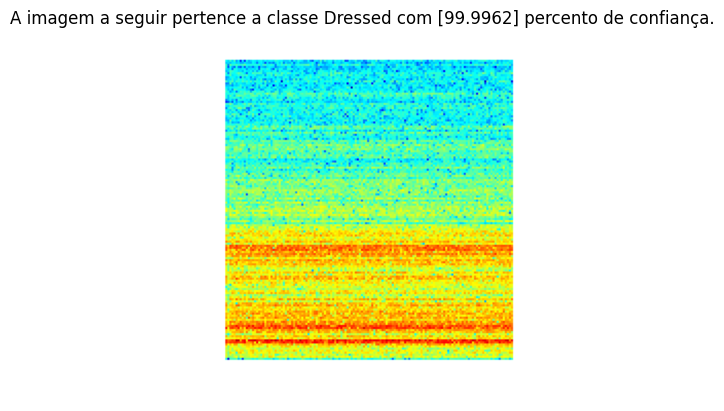

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_26.png
1/1 [==============================] - 0s 28ms/step
[4.023472e-05]


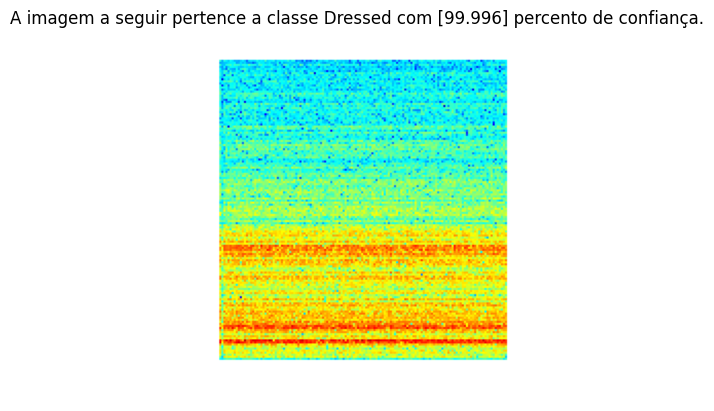

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_28.png
1/1 [==============================] - 0s 26ms/step
[1.2837357e-06]


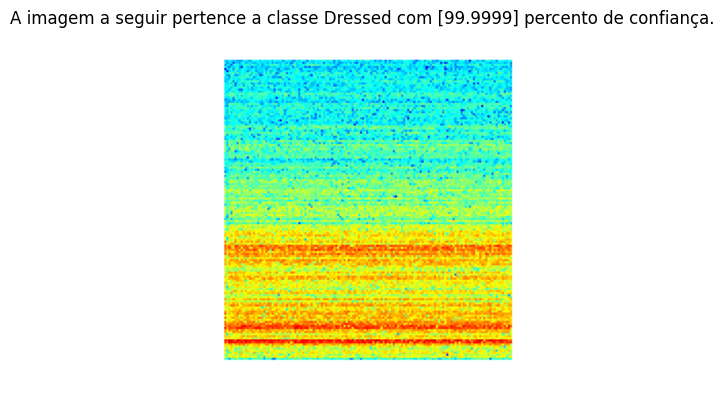

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_31.png
1/1 [==============================] - 0s 46ms/step
[1.2185353e-05]


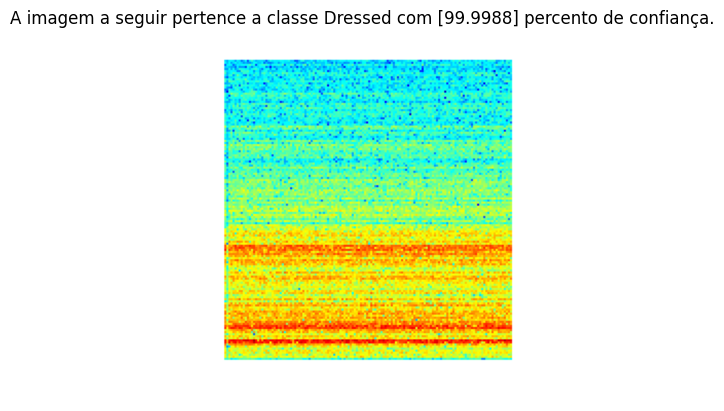

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_29.png
1/1 [==============================] - 0s 41ms/step
[7.739726e-06]


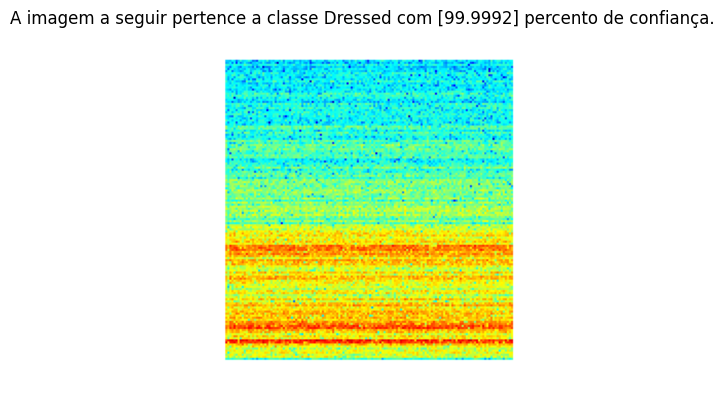

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_14.png
1/1 [==============================] - 0s 45ms/step
[0.00025146]


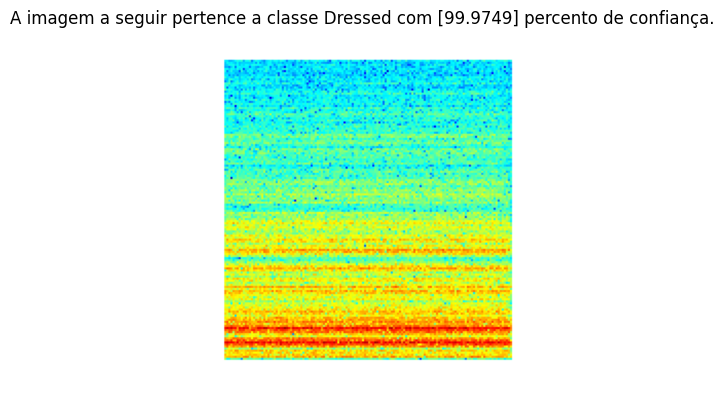

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_30.png
1/1 [==============================] - 0s 47ms/step
[2.4936228e-06]


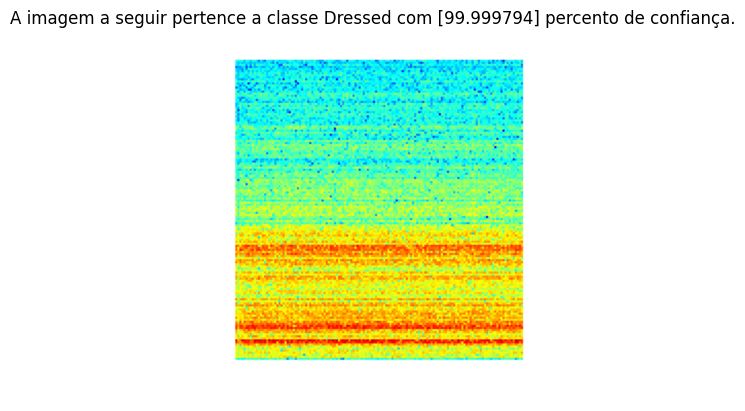

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R100_E3R2_32.png
1/1 [==============================] - 0s 45ms/step
[3.8677146e-05]


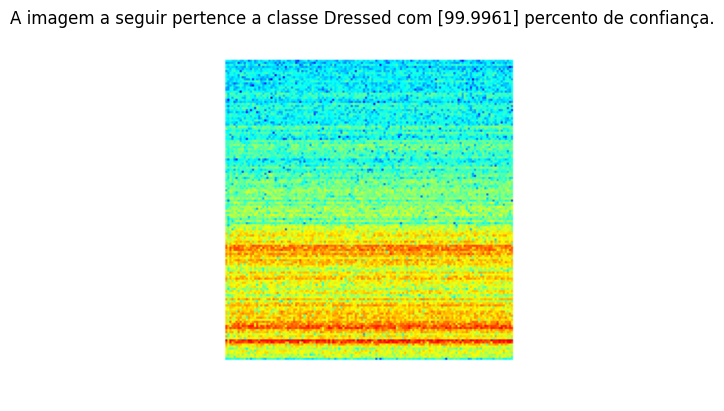

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_15.png
1/1 [==============================] - 0s 28ms/step
[0.00018088]


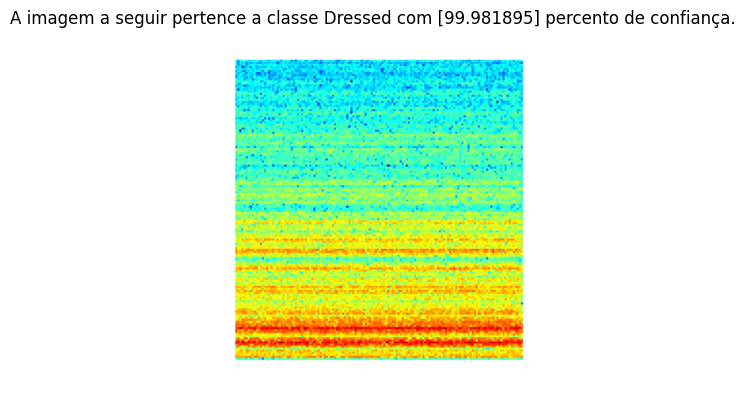

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_20.png
1/1 [==============================] - 0s 32ms/step
[0.00043383]


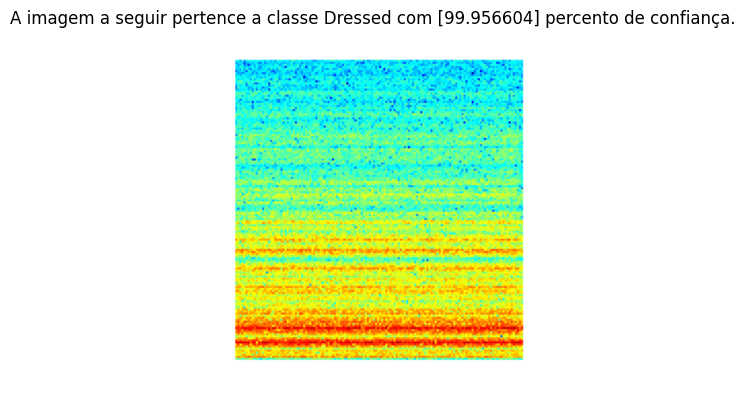

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_17.png
1/1 [==============================] - 0s 28ms/step
[0.00030519]


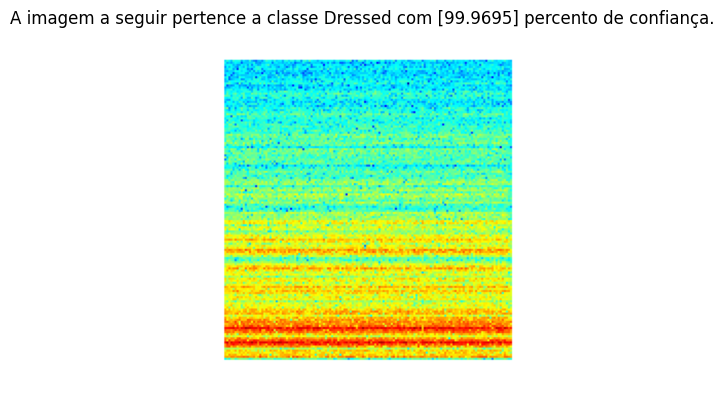

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_21.png
1/1 [==============================] - 0s 29ms/step
[0.00028507]


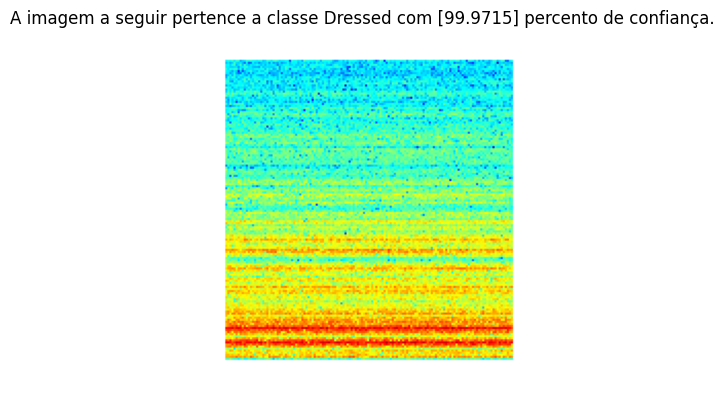

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_16.png
1/1 [==============================] - 0s 28ms/step
[0.0001625]


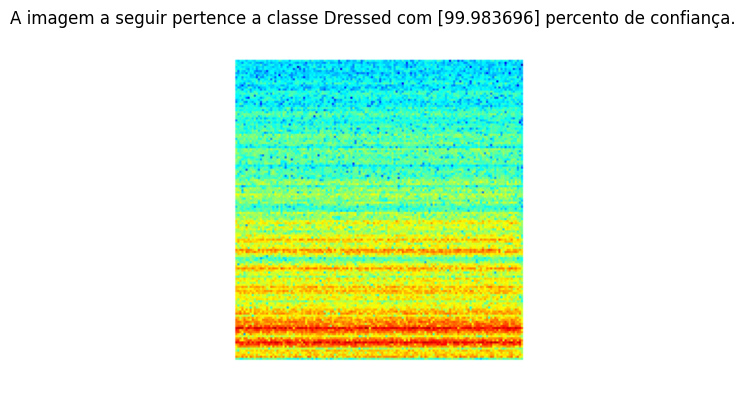

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_18.png
1/1 [==============================] - 0s 28ms/step
[6.2418505e-05]


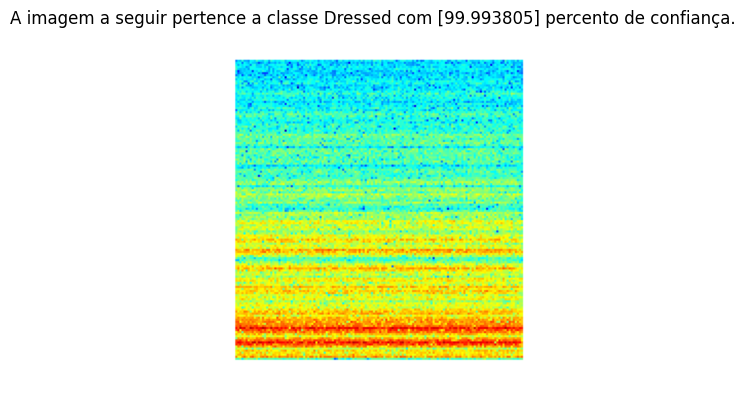

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_19.png
1/1 [==============================] - 0s 29ms/step
[0.00061721]


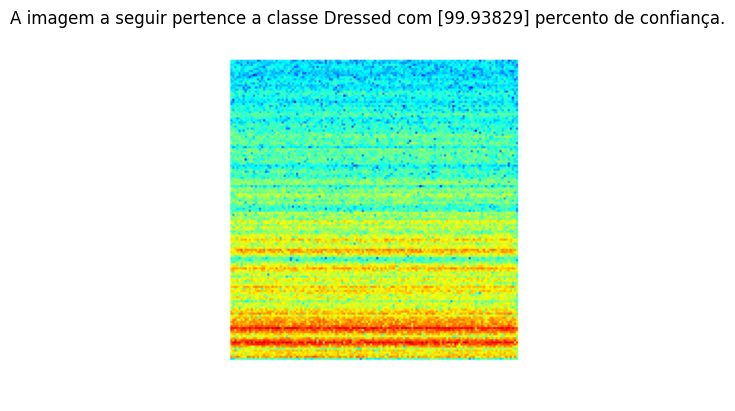

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_22.png
1/1 [==============================] - 0s 27ms/step
[7.852216e-05]


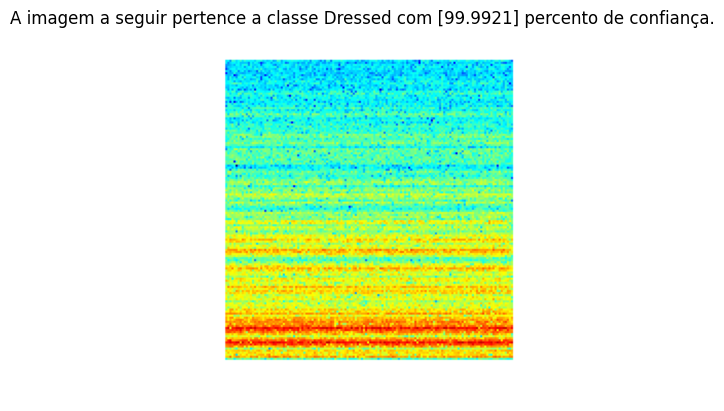

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_23.png
1/1 [==============================] - 0s 28ms/step
[0.00013043]


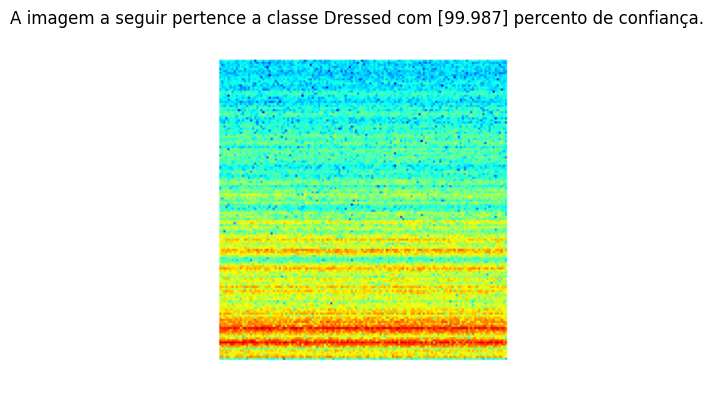

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_24.png
1/1 [==============================] - 0s 41ms/step
[0.00010573]


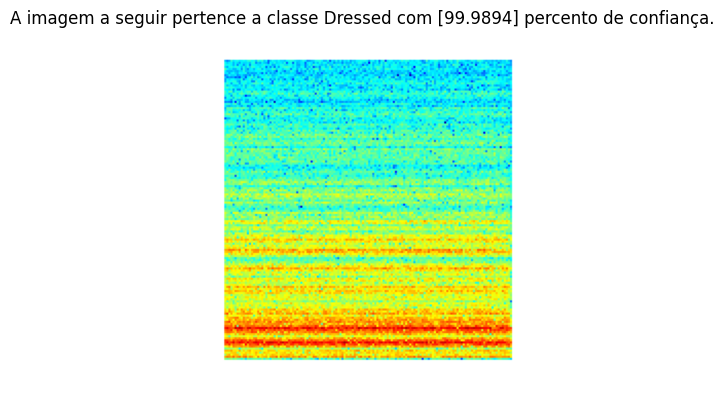

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_09.png
1/1 [==============================] - 0s 145ms/step
[0.00286489]


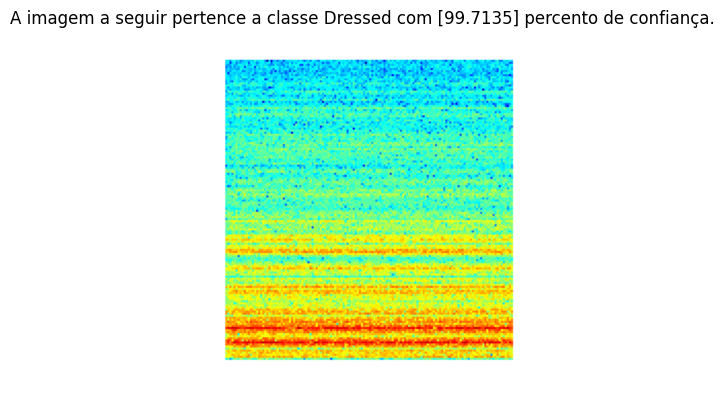

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E1R2_25.png
1/1 [==============================] - 0s 45ms/step
[6.678546e-05]


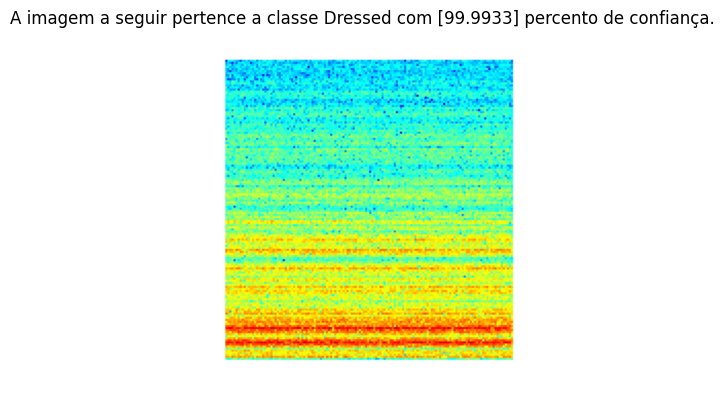

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_12.png
1/1 [==============================] - 0s 48ms/step
[0.00019022]


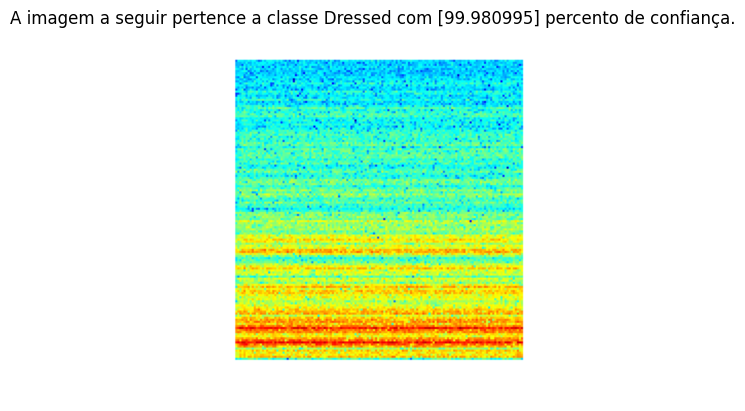

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_10.png
1/1 [==============================] - 0s 80ms/step
[0.02245324]


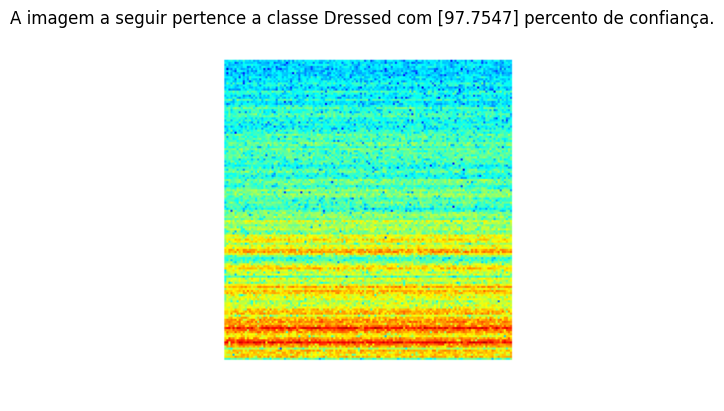

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_11.png
1/1 [==============================] - 0s 58ms/step
[0.00114409]


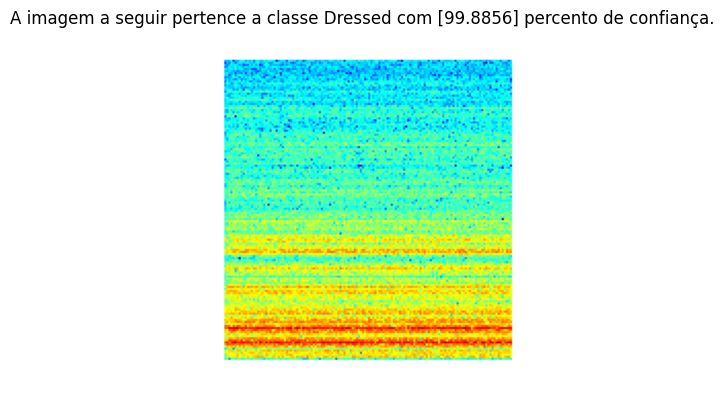

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_14.png
1/1 [==============================] - 0s 43ms/step
[0.01228749]


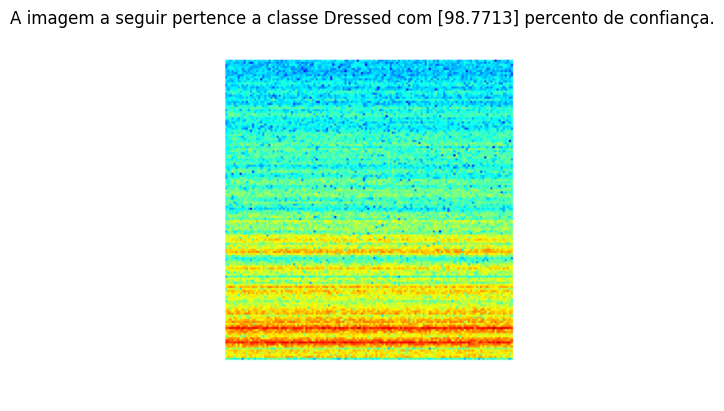

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_13.png
1/1 [==============================] - 0s 45ms/step
[0.00070811]


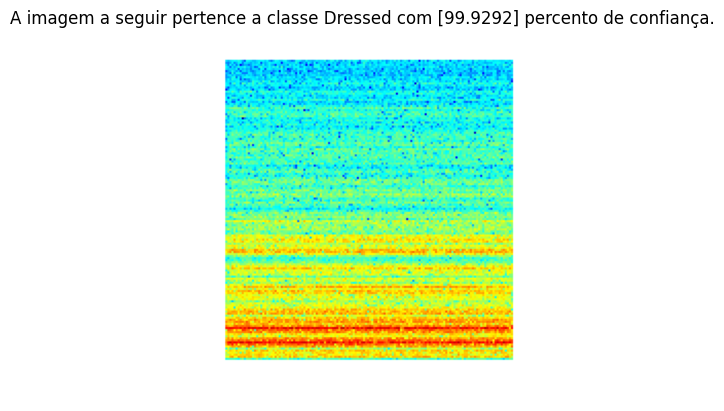

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_15.png
1/1 [==============================] - 0s 53ms/step
[0.00037879]


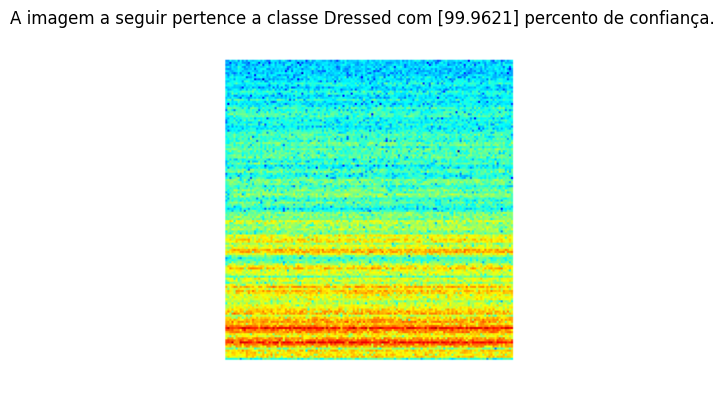

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_16.png
1/1 [==============================] - 0s 28ms/step
[0.00155091]


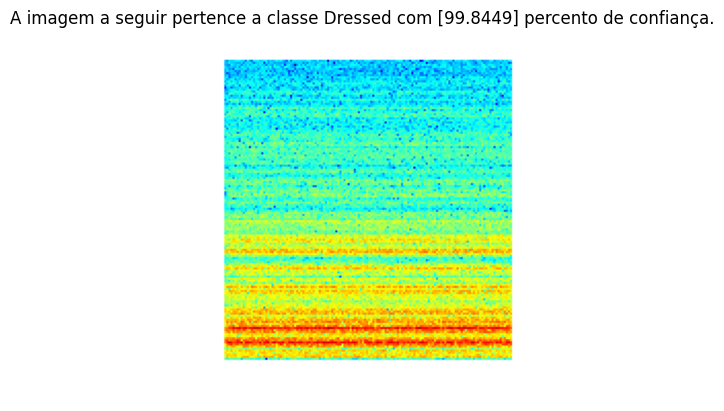

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_19.png
1/1 [==============================] - 0s 31ms/step
[0.00200369]


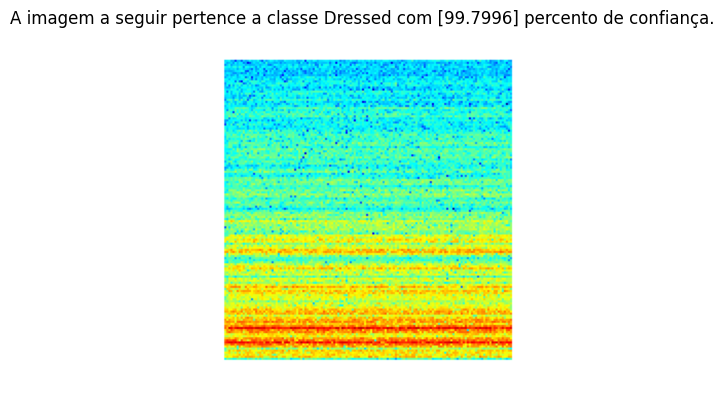

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_20.png
1/1 [==============================] - 0s 30ms/step
[0.00349498]


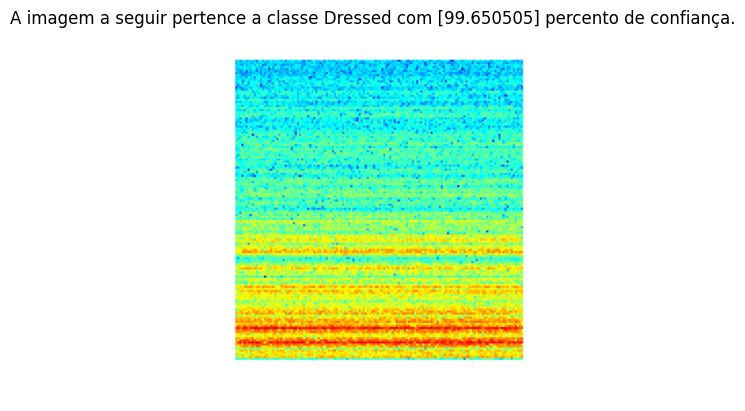

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_22.png
1/1 [==============================] - 0s 29ms/step
[0.00156729]


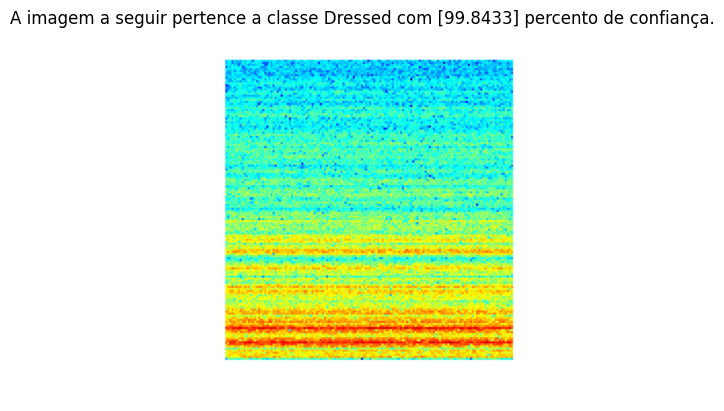

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_21.png
1/1 [==============================] - 0s 37ms/step
[0.00268108]


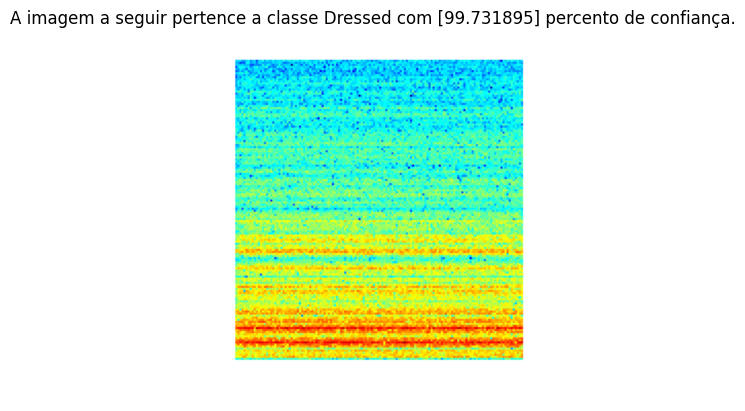

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_18.png
1/1 [==============================] - 0s 39ms/step
[0.00056329]


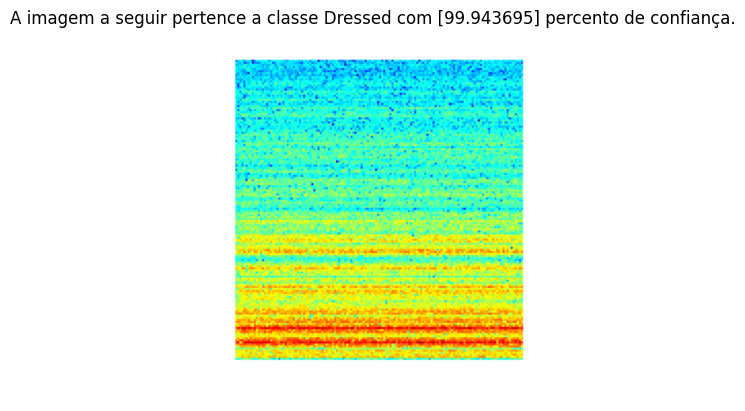

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_17.png
1/1 [==============================] - 0s 28ms/step
[0.0096529]


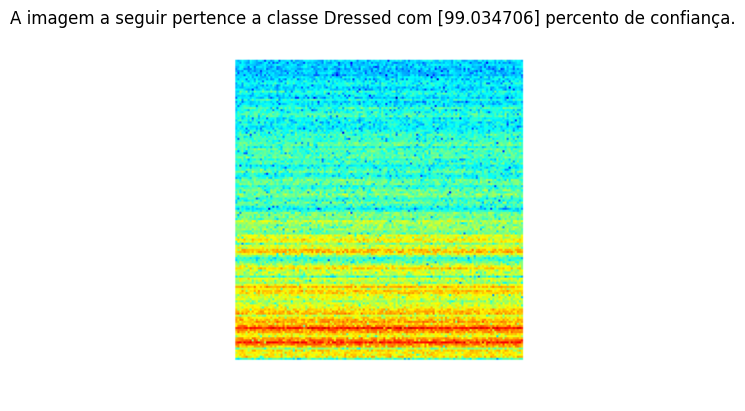

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_25.png
1/1 [==============================] - 0s 28ms/step
[0.00034635]


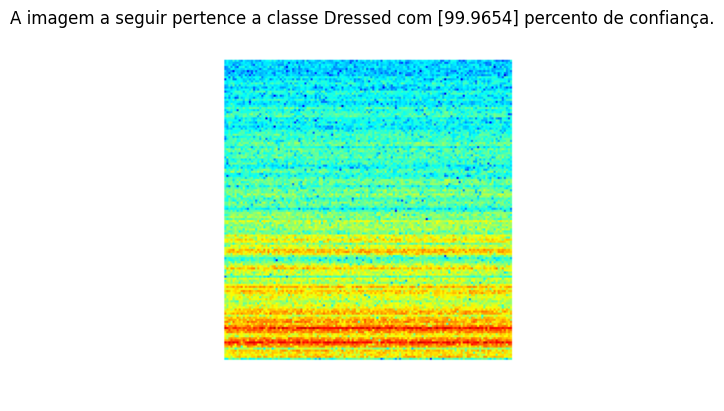

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_26.png
1/1 [==============================] - 0s 29ms/step
[0.000932]


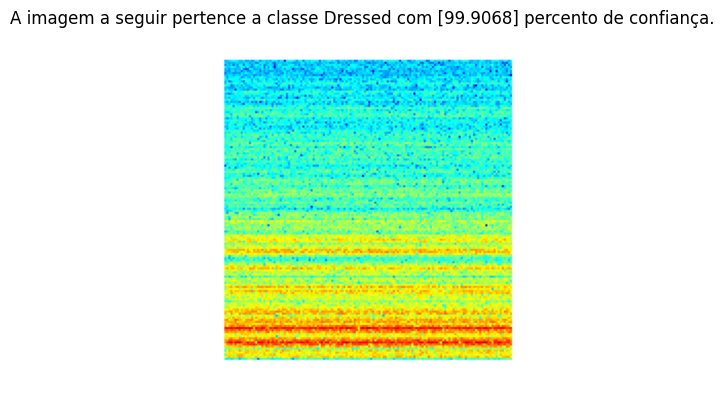

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_27.png
1/1 [==============================] - 0s 34ms/step
[0.00037123]


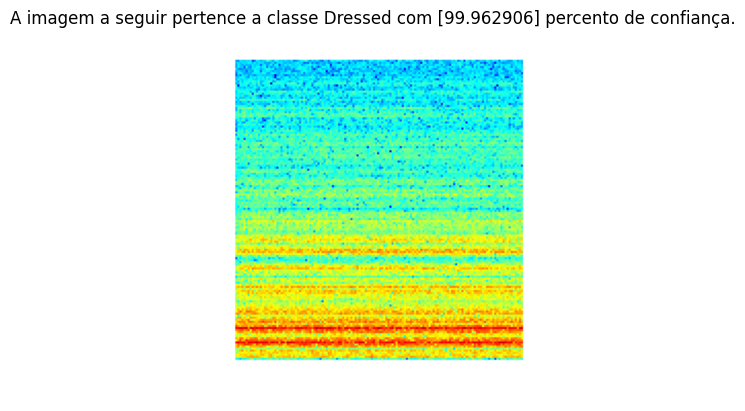

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_23.png
1/1 [==============================] - 0s 57ms/step
[0.00090325]


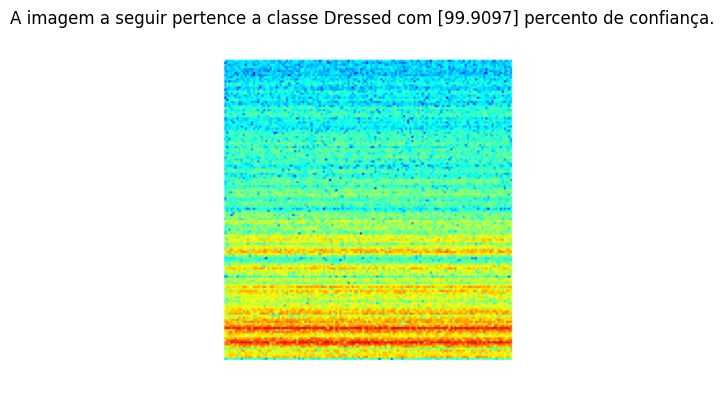

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_28.png
1/1 [==============================] - 0s 63ms/step
[8.9581554e-05]


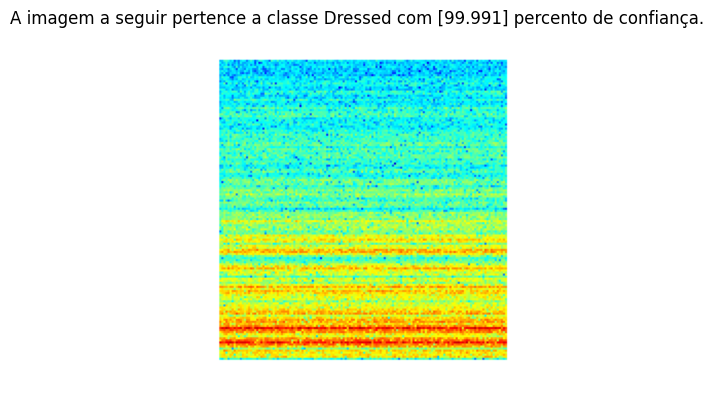

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_29.png
1/1 [==============================] - 0s 60ms/step
[0.00031733]


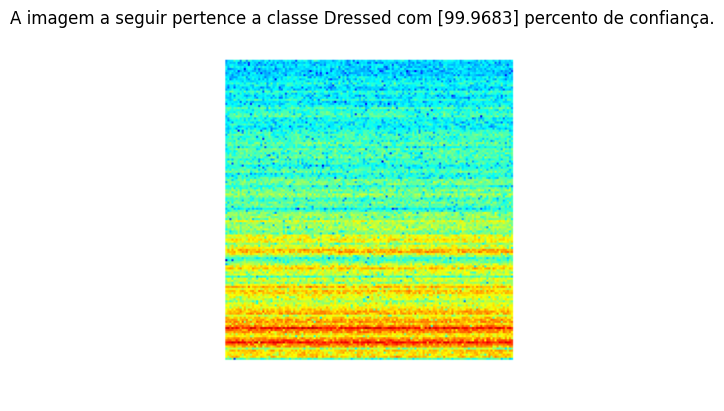

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_13.png
1/1 [==============================] - 0s 65ms/step
[0.00032783]


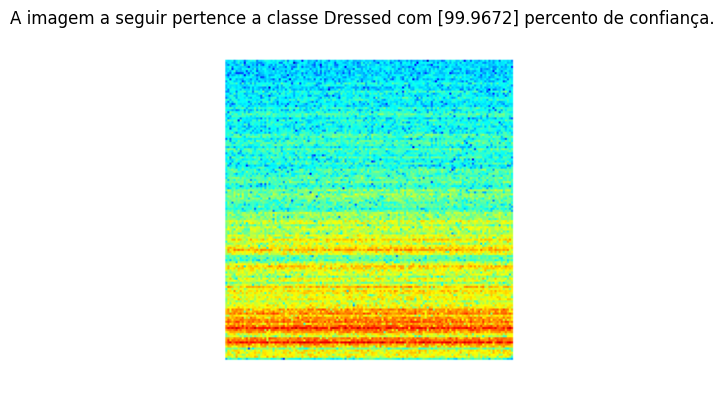

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_12.png
1/1 [==============================] - 0s 83ms/step
[0.00114227]


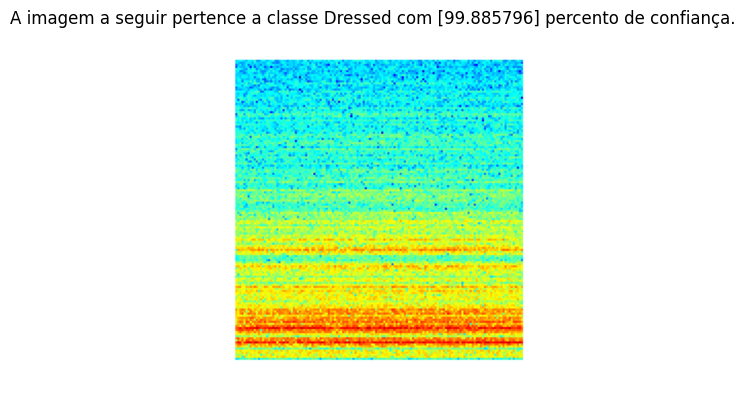

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_14.png
1/1 [==============================] - 0s 82ms/step
[0.00070136]


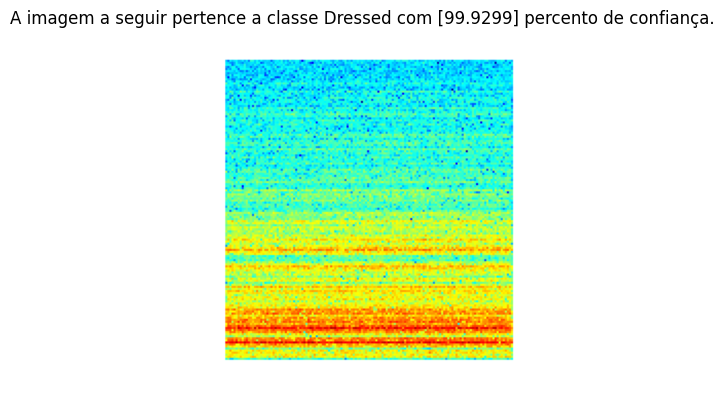

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E2R3_24.png
1/1 [==============================] - 0s 49ms/step
[0.00045218]


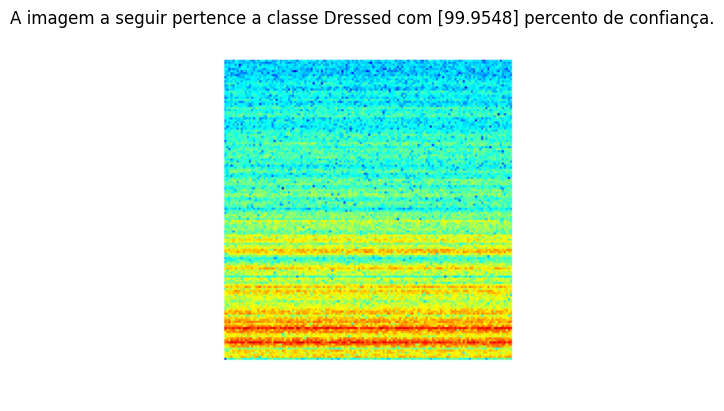

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_15.png
1/1 [==============================] - 0s 47ms/step
[0.00015311]


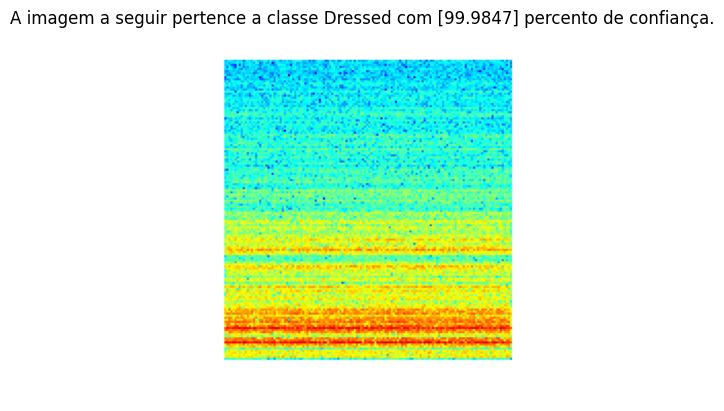

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_16.png
1/1 [==============================] - 0s 41ms/step
[0.00029975]


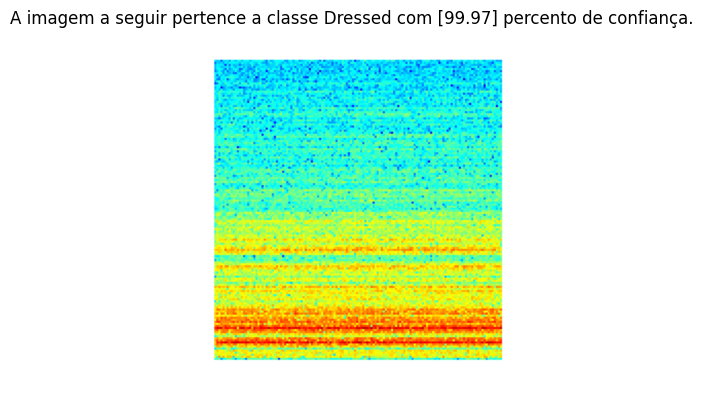

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_19.png
1/1 [==============================] - 0s 42ms/step
[0.00021292]


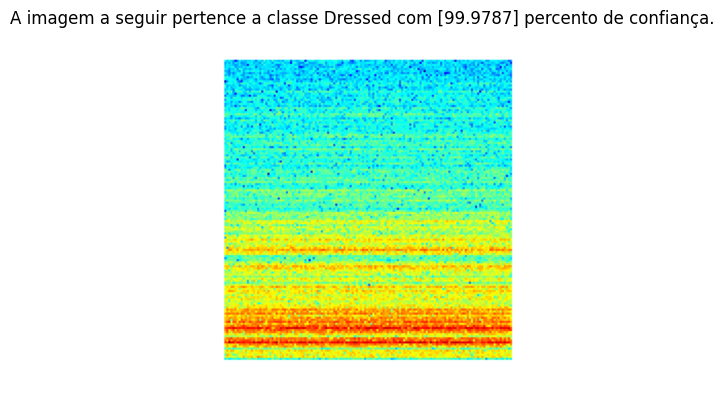

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_18.png
1/1 [==============================] - 0s 43ms/step
[2.0143309e-05]


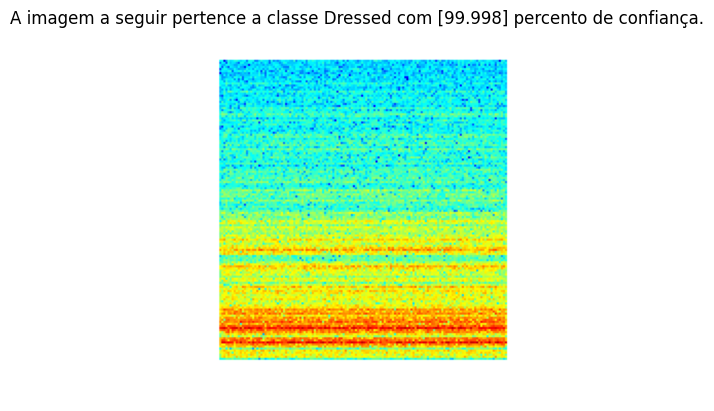

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_17.png
1/1 [==============================] - 0s 43ms/step
[5.7558977e-05]


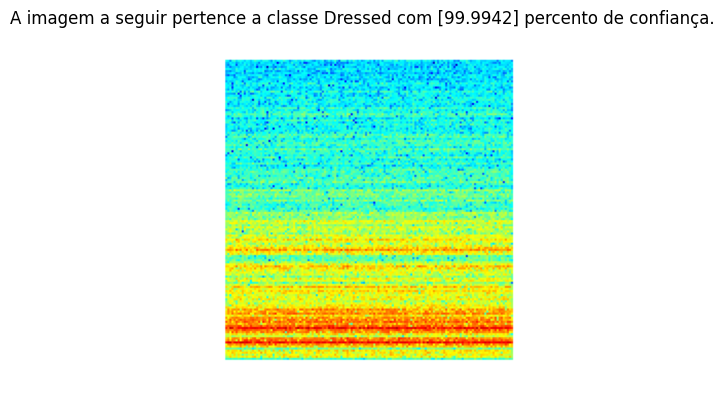

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_20.png
1/1 [==============================] - 0s 42ms/step
[3.9964366e-06]


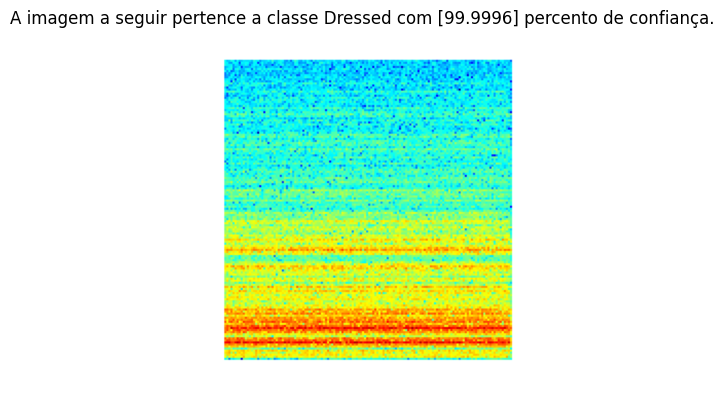

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_21.png
1/1 [==============================] - 0s 48ms/step
[3.5569715e-06]


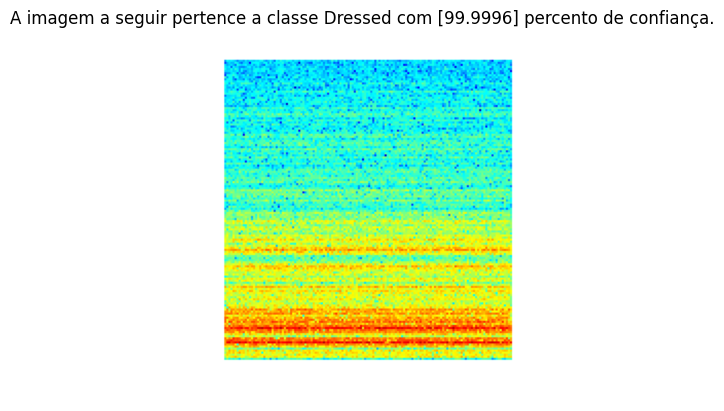

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_22.png
1/1 [==============================] - 0s 62ms/step
[1.248548e-05]


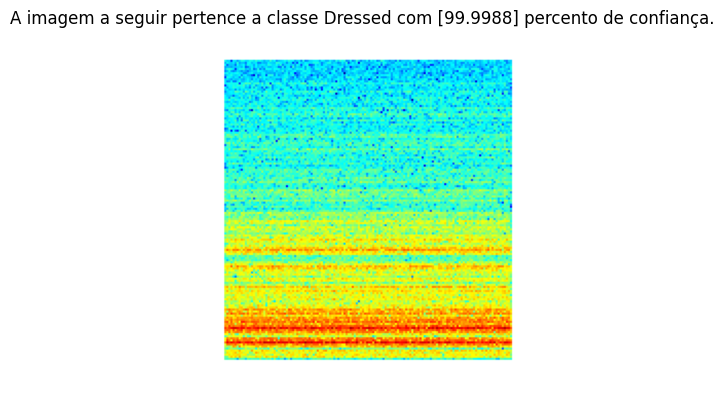

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_26.png
1/1 [==============================] - 0s 60ms/step
[2.4293035e-05]


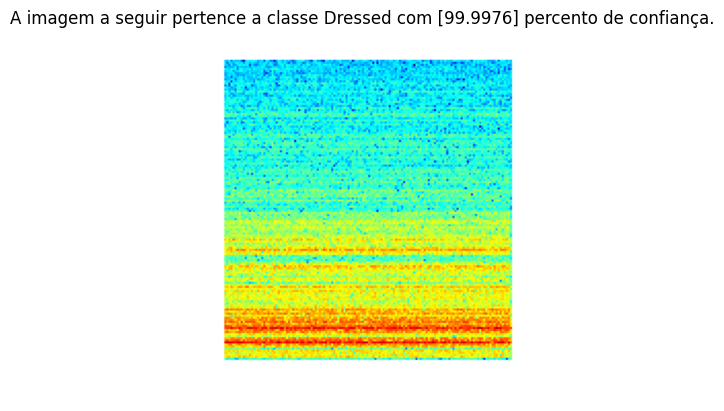

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_27.png
1/1 [==============================] - 0s 66ms/step
[6.025623e-06]


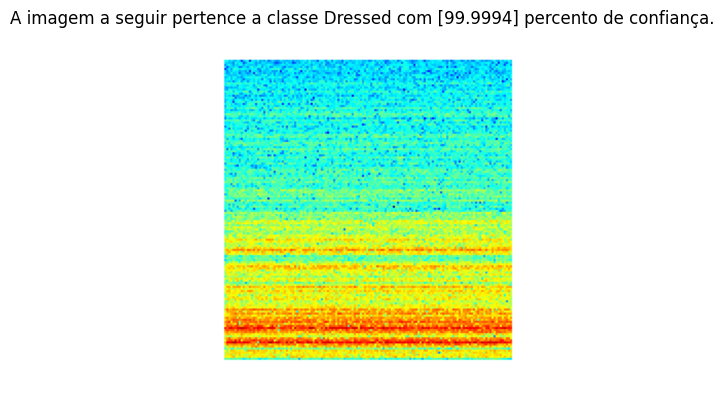

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_24.png
1/1 [==============================] - 0s 44ms/step
[8.97027e-06]


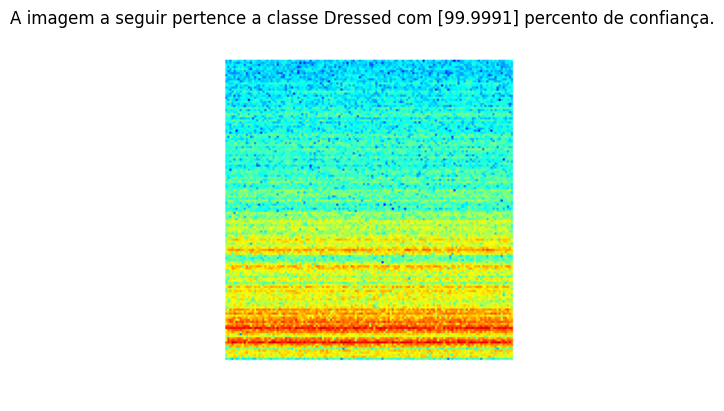

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_25.png
1/1 [==============================] - 0s 79ms/step
[3.3229684e-05]


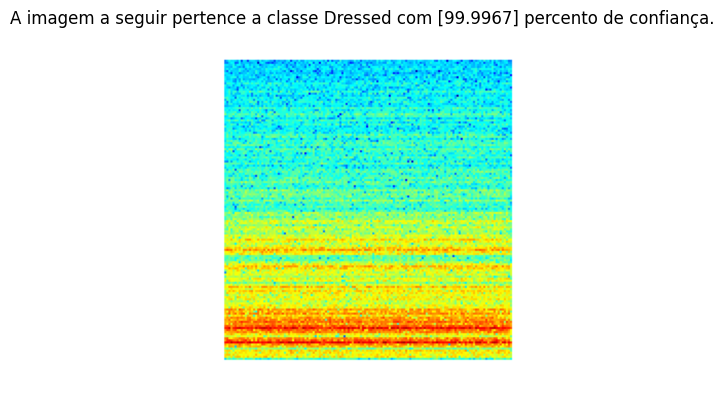

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_29.png
1/1 [==============================] - 0s 43ms/step
[3.3707056e-05]


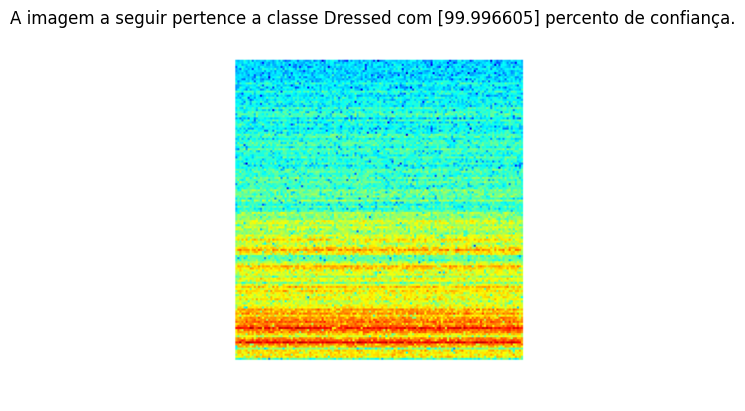

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_23.png
1/1 [==============================] - 0s 63ms/step
[1.5491894e-05]


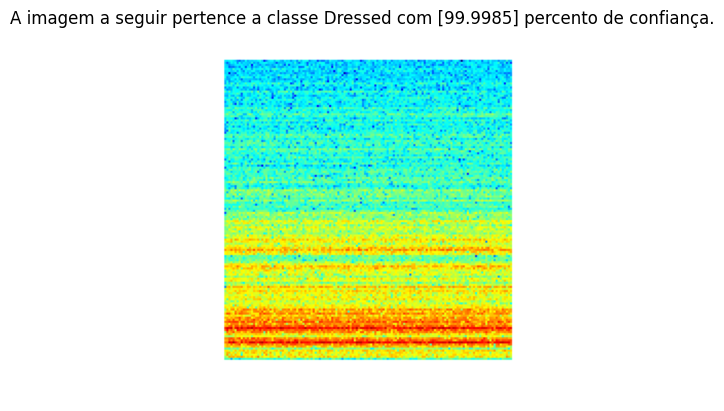

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_30.png
1/1 [==============================] - 0s 55ms/step
[8.319212e-06]


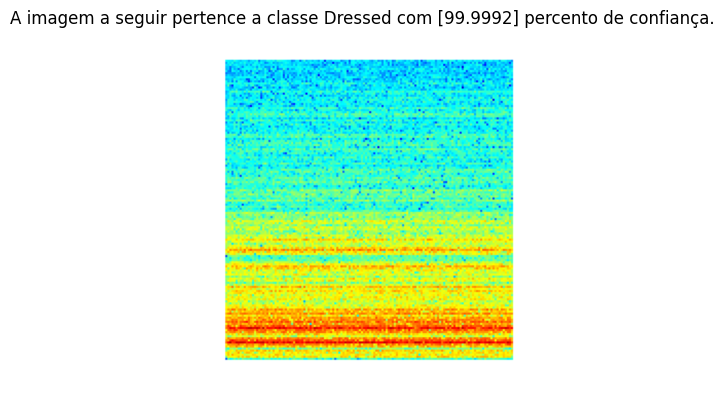

./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/R150_E3R2_28.png
1/1 [==============================] - 0s 83ms/step
[8.2580016e-07]


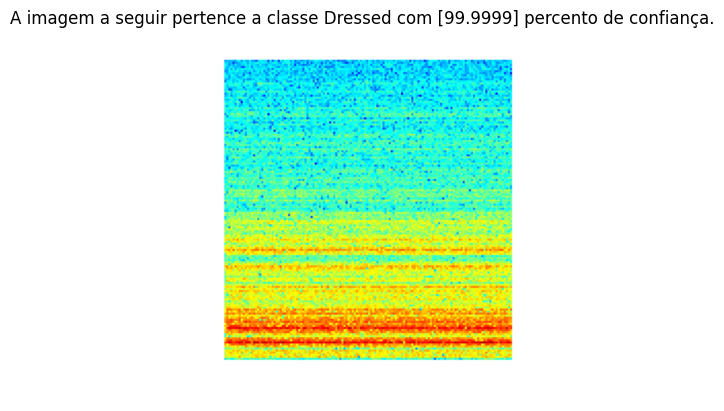

In [ ]:
#Caminho das imagens de teste Dressed
diretorio_imagens = "./content/drive/MyDrive/Rebolo/validation/VALIDAÇÃO v03/Dressed/"

arquivos = os.listdir(diretorio_imagens)

print(f"O número de arquivos da classe {len(arquivos)}")
for arquivo in arquivos:
    sunflower_url = os.path.join(diretorio_imagens, arquivo)
    print(sunflower_url)
    if arquivo.endswith(".png"):
        img = tf.keras.utils.load_img(
            sunflower_url, target_size=(img_height, img_width)
        )
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0) # Create a batch

        x=img_array
        x /= 255
        x=np.expand_dims(x, axis=0)

        classes = model.predict(img_array)

        print(classes[0])

        classe=""
        percent=0
        if classes[0]>0.5:
          classe = "Undressed"
          percent = np.round(classes[0], 6)*100
        else:
          classe = "Dressed"
          percent = (1-np.round(classes[0], 6))*100

        if(classe=="Dressed"):
          acertou.append(1)
        else:
          acertou.append(0)
        contador+=1
        numero.append(contador)
        nomes_csv.append(arquivo)
        labelVerdadeiro.append("Dressed")
        labelPredito.append(classe)
        acuraciaPercentagem.append(percent)
        resultadoFuncaoAtivacao.append(np.round(classes[0], 6))
        # Texto para o título da imagem
        title_text = f"A imagem a seguir pertence a classe {classe} com {percent} percento de confiança."

        # Exibir a imagem com o título usando matplotlib
        plt.figure()
        plt.imshow(img_array[0]/255.0)  # Normalizar os valores de pixel para o intervalo [0, 1]
        plt.title(title_text)
        plt.axis('off')
        plt.show()

In [ ]:
import csv

#Salvando as listas num csv para gerar gráficos no Excel
caminho_csv = './content/dados.csv'

with open(caminho_csv, mode='w', newline='') as file:
    writer = csv.writer(file)

    writer.writerow(["nome", "labelVerdadeiro", "labelPredito", "acuraciaPercentagem", "resultadoFuncaoAtivacao", "numeroImagem","acertou"])

    for i in range(len(nomes_csv)):
        writer.writerow([nomes_csv[i], labelVerdadeiro[i], labelPredito[i], round(acuraciaPercentagem[i][0],3), round(resultadoFuncaoAtivacao[i][0],3), numero[i],acertou[i]])

print("Dados salvos no arquivo CSV com sucesso!")

Dados salvos no arquivo CSV com sucesso!
